# 2. 
### Use las funciones DVR vistas en clase para obtener los autoestados y autofunciones de una partícula
### cuántica en un pozo de paredes infintitas mediante la diagonalización del hamiltoniano en la base DVR.
### Compare con los resultados analíticos de este problema.

En este programa se verá para un par de paquetes de ondas desarrolladas en la base DVR la propagacion de una particula para una particula confinada en un pozo de paredes infinitas

Primero buscamos la manera que desde una función analítica cuadrado integrable crear una función que se desarrolle
automáticamente en la base de DVR, segundo, se define el Hamiltoniano para cada uno de los casos y asi luego se diagonaliza
para hallar los autoestados de energía, y con ello los autovectores que coinciden con los coeficientes de la base DVR para cada autoestado.

Por ultimo y usando el propagador temporal, se hallan los coeficientes $C_{n}$ para desarrollar $\Psi(x,t)$ en la base de autoestados, y luego
se hace la animación. También compararemos el valor de las energias con los resultados de la solución de las autofunciones analítica.

In [46]:
#Importamos librerías

import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from scipy import integrate
from IPython.display import HTML

## Funciones a usar

In [47]:
#Funciones DVR
def f(x,n):
    fun_DVR = np.zeros(Nf)
    for k in range(Nf):
        fun_DVR = fun_DVR + (2/math.sqrt(L*(Nf+1)) * np.sin(((k+1)*math.pi*x)/L)*np.sin(((k+1)*n*math.pi)/(Nf+1)))
    return fun_DVR

#Definicion del paquete de ondas inicial.
def Psi_0_Gauss(x):
    gauss = np.exp(-(x-x0)**2/(2*sigma) + 1j*p0*x/hbar  )
    return gauss

def Psi_0_Rect(x):
    cuad = np.where(np.abs(x - x0) <= 1 / 2, np.exp(1j * p0 * x), 0)
    return cuad


#Solución analítica de la energía cinética en la base DVR
def  fiddfj(i,j):
    fiddfj_num = 0
    for k in range(1,Nf+1):
        fiddfj_num = fiddfj_num - 2*(math.pi)**2/((Nf+1)*L**2) \
                      * (k**2 * np.sin( i*k*math.pi/(Nf+1) )*np.sin(j*k*math.pi/(Nf+1) ) )
    return fiddfj_num


#Función de onda propagada para distintos paquetes de onda inicial.
def Psi_Gauss_aprox(tt):
    Psi = np.zeros(Nf)
    for l in range(Nf):
        Psi = Psi + ampl*cn_aproxx_Gauss[l]*(phin[:,l:l+1].T)[0]*np.exp(-1j*En[l]*(tt-t0))
    return Psi

def Psi_Gauss_ideal(tt):
    Psi = np.zeros(Nf)
    for l in range(Nf):
        Psi = Psi + ampl*cn_Ideal_Gauss[l]*(phin[:,l:l+1].T)[0]*np.exp(-1j*En[l]*(tt-t0))
    return Psi

def Psi_Rect_aprox(tt):
    Psi = np.zeros(Nf)
    for l in range(Nf):
        Psi = Psi + ampl*cn_aproxx_Rect[l]*(phin[:,l:l+1].T)[0]*np.exp(-1j*En[l]*(tt-t0))
    return Psi
    
def Psi_Rect_ideal(tt):
    Psi = np.zeros(Nf)
    for l in range(Nf):
        Psi = Psi + ampl*cn_Ideal_Rect[l]*(phin[:,l:l+1].T)[0]*np.exp(-1j*En[l]*(tt-t0))
    return Psi

#Definición de las autofunciones analiticas del problema del pozo infinito.
def autosine(x,n):
    return math.sqrt(2/L)*np.sin(n*math.pi*x/L)


#función de estado inicial de la animación
def init():
    line_module_Gauss_Approx.set_data([],[]) 
    line_module_Gauss_Ideal.set_data([],[])           

    line_module_Rect_Approx.set_data([],[]) 
    line_module_Rect_Ideal.set_data([],[]) 
    
    frame_text1.set_text('')
    frame_text2.set_text('')
    return line_module_Gauss_Approx,line_module_Gauss_Ideal,line_module_Rect_Approx,line_module_Rect_Ideal, frame_text1, frame_text2

#Función en la que vemos propagandose la función de onda.
def animate(frames):
    tt = (frames+1) * 0.009
    y1 = Psi_Gauss_aprox(tt) 
    y2 = Psi_Gauss_ideal(tt) 
    y3 = Psi_Rect_aprox(tt) 
    y4 = Psi_Rect_ideal(tt) 


    
    line_module_Gauss_Approx.set_data(xvals, np.abs(y1)**2) 
    line_module_Gauss_Ideal.set_data(xvals, np.abs(y2)**2+1.5)          

    line_module_Rect_Approx.set_data(xvals, np.abs(y3)**2) 
    line_module_Rect_Ideal.set_data(xvals, np.abs(y4)**2+1.5)  
    
    frame_text1.set_text(f"{frames}")
    frame_text2.set_text(f"{frames}")
    return line_module_Gauss_Approx,line_module_Gauss_Ideal,line_module_Rect_Approx,line_module_Rect_Ideal, frame_text1, frame_text2

#Funcion producto punto entre funciones y vectores.
def dot(dom,fun1,fun2):
    if sum(dom) != 0:
        inte = integrate.simpson(fun1*fun2,dom)
        return inte
    else:
        # SI estamos aqui es porque fun1 y fun2 se tratan de vectores
        dot_prod = np.sum(fun1*fun2)
        return dot_prod

__Definición de parametros__

In [48]:
L = 4    # Longitud total del pozo
Nf = 130  #Puntos DVR
x0 = 2    #Posición inicial.
t0 = 0    #Tiempo inicial

hbar = 1
me = 1
sigma = 0.1
p0 = me*16  #momento inicial

ampl = 1

xvals = np.linspace(0,L,Nf)

Definimos entonces el paquete de ondas inicial en la base DVR. Esto implica proyectar elpaquete de ondas en cada una de las funciones DVR. Para un caso ideal en la que la funciones DVR se acerquen demasiado a una delta de dirac se cumplira que :

$$
<fn|\Psi_{0}> = \sqrt{\frac{L}{Nf+1}} \Psi_{0}(X_{n})
$$

En el programa se canculó para un paquete de ondas Gaussiano los coeficientes proyectando directamente la funcion sobre la funcion DVR, luego tambien usando la definición de arriba, existira una discrepancia en el modo de desarrollo ya que la definición de arriba supone una idealización de las funciones DVR.

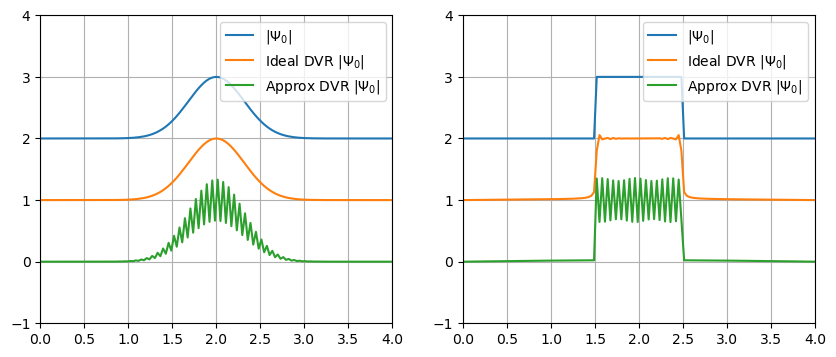

In [49]:
approx_Gauss = []
Ideal_Gauss = []

approx_Rect = []
Ideal_Rect = []

for i in range(1,Nf+1):
    approx_Gauss.append(dot(xvals,f(xvals,i),Psi_0_Gauss(xvals)))
    Ideal_Gauss.append(math.sqrt(L/(Nf+1))*Psi_0_Gauss(i*L/(Nf+1)))
    
    approx_Rect.append(dot(xvals,f(xvals,i),Psi_0_Rect(xvals)))
    Ideal_Rect.append(math.sqrt(L/(Nf+1))*Psi_0_Rect(i*L/(Nf+1)))

    
approx_Gauss = np.array(approx_Gauss)
Ideal_Gauss = np.array(Ideal_Gauss)

approx_Rect = np.array(approx_Rect)
Ideal_Rect = np.array(Ideal_Rect)

phi_0_Gauss_approxConsts =np.zeros(Nf)
phi_0_Gauss_IdealConsts =np.zeros(Nf)

phi_0_Rect_approxConsts =np.zeros(Nf)
phi_0_Rect_IdealConsts =np.zeros(Nf)

for i in range(1,Nf+1):
    phi_0_Gauss_approxConsts    = phi_0_Gauss_approxConsts    + approx_Gauss[i-1]*f(xvals,i)
    phi_0_Gauss_IdealConsts = phi_0_Gauss_IdealConsts + Ideal_Gauss[i-1]*f(xvals,i)

    phi_0_Rect_approxConsts    = phi_0_Rect_approxConsts    + approx_Rect[i-1]*f(xvals,i)
    phi_0_Rect_IdealConsts = phi_0_Rect_IdealConsts + Ideal_Rect[i-1]*f(xvals,i)

fig1,(ax1,ax2) = plt.subplots(1,2,figsize=(10, 4))
ax1.set_xlim(0,L)
ax1.set_ylim(-1,4)
ax2.set_xlim(0,L)
ax2.set_ylim(-1,4)

ax1.plot(xvals,np.abs(Psi_0_Gauss(xvals))+2,label = f"$|\Psi_0|$")
ax1.plot(xvals,np.abs(phi_0_Gauss_IdealConsts)+1,label = f"Ideal DVR $|\Psi_0|$")
ax1.plot(xvals,np.abs(phi_0_Gauss_approxConsts),label = f"Approx DVR $|\Psi_0|$")
ax1.grid(True)             
ax1.legend() 

ax2.plot(xvals,np.abs(Psi_0_Rect(xvals))+2,label = f"$|\Psi_0|$")
ax2.plot(xvals,np.abs(phi_0_Rect_IdealConsts)+1,label = f"Ideal DVR $|\Psi_0|$")
ax2.plot(xvals,np.abs(phi_0_Rect_approxConsts),label = f"Approx DVR $|\Psi_0|$")
ax2.grid(True)             
ax2.legend() 



Ahora definimos el Hamiltoniano teniendo ya en cuenta que se trata de un pozo de paredes infinitas, dentro del pozo no habra potencial, por lo que solo hallamos los elementos de matriz de la energia cinetica.

In [50]:
H = np.zeros((Nf,Nf))

for l in range(Nf):
    for m in range(Nf):
        H[l,m] = - hbar**2/(2*me) * fiddfj(l+1,m+1)

Diagonalizamos para hallar los auto valores (Energias) y los autovectores.

In [51]:
En, bn = np.linalg.eig(H)
En = np.round(En,5)

idx = np.argsort(En)          
En = En[idx]                
bn = bn[:, idx]

Con los coeficientes de las funciones DVR para los autoestados, construimos los autoestados. Y al mismo tiempo calculamos coeficientes de probabilidad $C_{n}$

$$
\Psi_{0}(x) =  \sum_{n}^{} a_{n}f_{n}(x)  \quad  \quad \quad     \quad \quad \quad    \phi_{n}(x) =  \sum_{i}^{} b^{n}_{i}f_{i}(x)
$$

$$
c_{n} = \sum_{i}^{} \tilde{b^{n}_{i}}a_{i}
$$


In [52]:
phin = np.zeros((Nf,Nf))

for l in range(Nf):
    phinp = np.zeros((Nf,1))
    for m in range(Nf):
        phinp = phinp - bn[m,l]*np.array([f(xvals,m+1)]).T
    phin[:,l:l+1] = phinp/math.sqrt(dot(xvals,(phinp.T)[0],(phinp.T)[0]))


cn_aproxx_Gauss = []
cn_Ideal_Gauss = []


cn_aproxx_Rect = []
cn_Ideal_Rect = []

for l in range(Nf): 
    cn_aproxx_Gauss.append(sum((bn[:,l:l+1].T)[0]*approx_Gauss))
    cn_Ideal_Gauss.append(sum((bn[:,l:l+1].T)[0]*Ideal_Gauss))
    cn_aproxx_Rect.append(sum((bn[:,l:l+1].T)[0]*approx_Rect))
    cn_Ideal_Rect.append(sum((bn[:,l:l+1].T)[0]*Ideal_Rect))
 
cn_aproxx_Gauss = np.array(cn_aproxx_Gauss);cn_Ideal_Gauss = np.array(cn_Ideal_Gauss)
cn_aproxx_Rect = np.array(cn_aproxx_Rect);cn_Ideal_Rect = np.array(cn_Ideal_Rect)

cn_aproxx_Gauss = cn_aproxx_Gauss/np.linalg.norm(cn_aproxx_Gauss)**2;cn_aproxx_Rect = cn_aproxx_Rect/np.linalg.norm(cn_aproxx_Rect)**2
cn_Ideal_Gauss = cn_Ideal_Gauss/np.linalg.norm(cn_Ideal_Gauss)**2;cn_Ideal_Rect = cn_Ideal_Rect/np.linalg.norm(cn_Ideal_Rect)**2
                                                                   

__Ya con esto estamos listos para simular__

In [53]:
fig2,(ax3,ax4) = plt.subplots(1,2,figsize=(10, 4))
ax3.set_xlim(0, L)
ax3.set_ylim(-0.3, 5)

ax4.set_xlim(0, L)
ax4.set_ylim(-0.3, 3)

line_module_Gauss_Approx, = ax3.plot([], [], lw=2, color = 'red',label= "Aproxx")
line_module_Gauss_Ideal, = ax3.plot([], [], lw=2, color = 'blue',label= "Ideal")
ax3.grid(True)             
ax3.legend()

line_module_Rect_Approx, = ax4.plot([], [], lw=2, color = 'red',label= "Aproxx")
line_module_Rect_Ideal, = ax4.plot([], [], lw=2, color = 'blue',label= "Ideal")
ax4.grid(True)   
ax4.legend()


frame_text1 = ax3.text(0.02, 0.9, '', transform=ax3.transAxes, fontsize=12, color='red')
frame_text2 = ax4.text(0.02, 0.9, '', transform=ax4.transAxes, fontsize=12, color='red')


ani = animation.FuncAnimation(fig2, animate,init_func=init, frames=200, interval=70, blit=True)

plt.close(fig2)  
HTML(ani.to_jshtml())


Ya por último, comparemos los resultados de aproximar con funciones DVR a el caso exacto. Usaremos las constantes de desarrollo ideales para observar mejor la forma de las autofunciones.

Text(0.5, 1.0, 'Aprox Eigen-states')

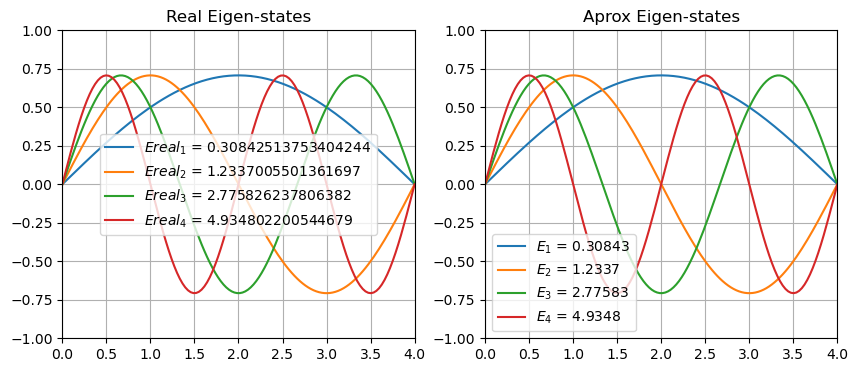

In [54]:
fig3,(ax5,ax6) = plt.subplots(1,2,figsize=(10, 4))
ax5.set_xlim(0, L)
ax5.set_ylim(-1, 1)

ax6.set_xlim(0, L)
ax6.set_ylim(-1, 1)

for l in range(4):
    ax5.plot(xvals,autosine(xvals,l+1), label= f"$Ereal_{l+1}$ = {(l+1)**2*math.pi**2*hbar**2/( 2*me*L**2 )}")
    ax6.plot(xvals,(phin[:,l:l+1].T)[0], label= f"$E_{l+1}$ = {En[l]}")

ax5.grid(True)
ax5.legend()
ax5.set_title("Real Eigen-states")

ax6.grid(True)
ax6.legend()
ax6.set_title("Aprox Eigen-states")